In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
import plotly.express as px

from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.cluster import HDBSCAN, KMeans
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import umap
import hdbscan

import sys
sys.path.append("..")

In [3]:
# Reading in dataset of recipes by ingredients
# Reference: https://www.kaggle.com/datasets/alincijov/cooking-ingredients?select=train.csv

# Loading in the dataset
df = pd.read_csv('../data/recipes_by_ingredients.csv', index_col = 0)
df = df.astype(int)
df

,achiote paste,achiote powder,acini di pepe,acorn squash,active dry yeast,adobo sauce,adobo seasoning,adzuki beans,agave nectar,agave tequila,...,yellow rock sugar,yellow squash,yellow summer squash,yellow tomato,yellowfin tuna,yogurt cheese,yucca root,yukon gold potatoes,yuzu juice,zucchini blossoms
label,,,,,,,,,,,,,,,,,,,,,
Infineon Raceway Baked Beans,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sour Cream Noodle Bake,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Middle-Eastern Eggplant Rounds,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Saffron Jewel Rice,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Thai Sweet and Sour Wings,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Spicy Agave Wave,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
Apple Chimichangas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Summer Corn Salad,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


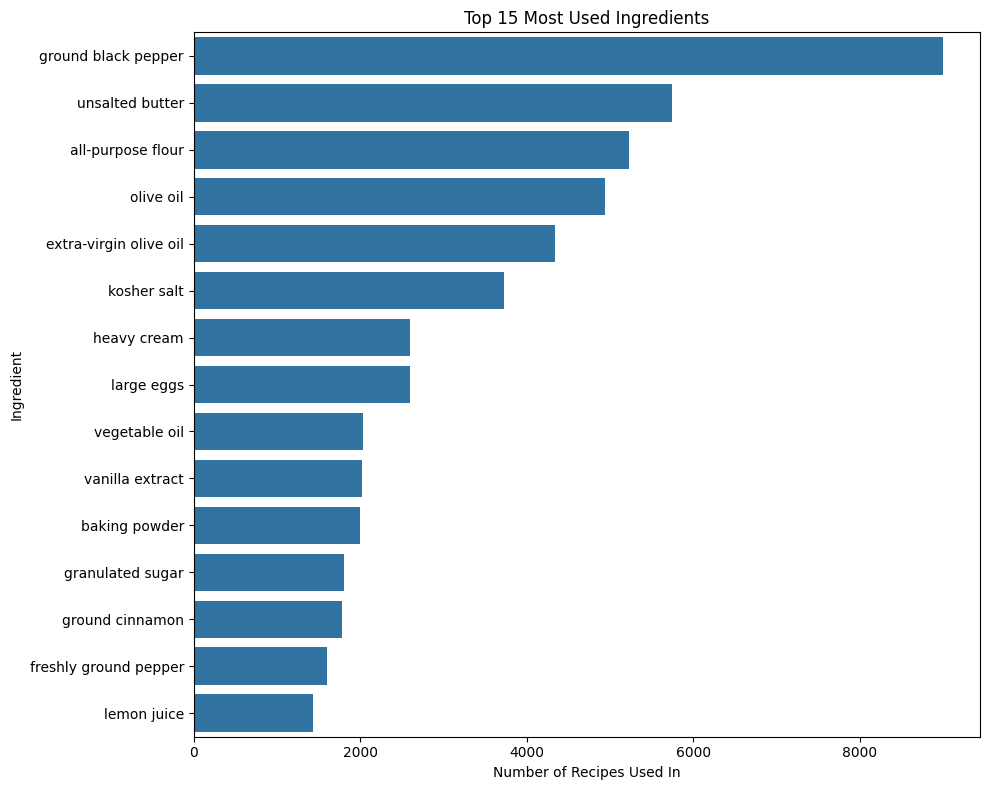

In [3]:
# Plotting batplot with the most used ingredients

# Count how many recipes each ingredient appears in
usage_counts = (df == 1).sum(axis=0)

# Take top 15
top15 = usage_counts.sort_values(ascending=False).head(15)

# Tidy format for seaborn
top15 = top15.reset_index()
top15.columns = ["ingredient", "count"]

plt.figure(figsize=(10, 8))
sns.barplot(
    data=top15,
    y="ingredient",
    x="count"
)
plt.title("Top 15 Most Used Ingredients")
plt.xlabel("Number of Recipes Used In")
plt.ylabel("Ingredient")
plt.tight_layout()
plt.show()

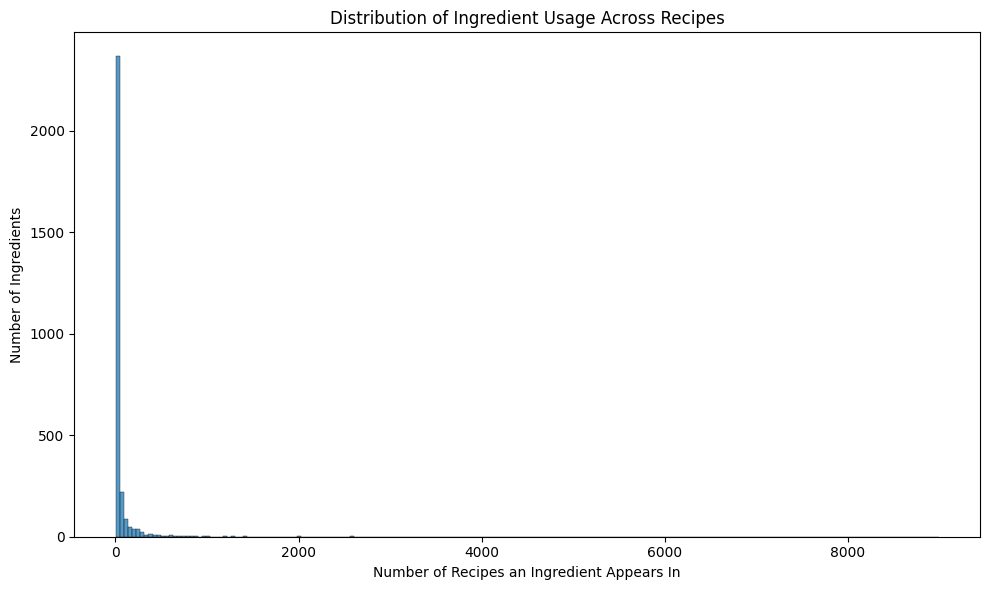

In [4]:
# Plotting a histogram of ingredient frequency.

# Count how many recipes use each ingredient
usage_counts = (df == 1).sum(axis=0)

plt.figure(figsize=(10,6))
sns.histplot(usage_counts, bins=200)   # choose bins as you prefer

plt.title("Distribution of Ingredient Usage Across Recipes")
plt.xlabel("Number of Recipes an Ingredient Appears In")
plt.ylabel("Number of Ingredients")
plt.tight_layout()
plt.show()

Most ingredients appear to be only used in < 100 recipes. This goes on to show that the dataset contains ingredients that are not as commonly used (which is great). There are only a handful of ingredients that will show up in most recipes because they are basics, like salt, pepper, oil, flour.

In [5]:
# Let us try to visualize the recipes using PCA
pca = PCA(n_components=2)
pca_coords = pca.fit_transform(df.values)

plot_df = pd.DataFrame({
    "x": pca_coords[:, 0],
    "y": pca_coords[:, 1],
    "recipe_name": df.index
})

fig = px.scatter(
    plot_df,
    x="x",
    y="y",
    hover_name="recipe_name",
    title="2D Representation of Recipes (PCA)",
    width=800,
    height=600
)

fig.show()

In [7]:
# Let us visualize the recipes with UMAP (using a Euclidean distance)

reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
umap_coords = reducer.fit_transform(df.values)

plot_df = pd.DataFrame({
    "x": umap_coords[:, 0],
    "y": umap_coords[:, 1],
    "recipe_name": df.index
})

fig = px.scatter(
    plot_df,
    x="x",
    y="y",
    hover_name="recipe_name",
    title="2D Representation of Recipes (UMAP, Euclidean Distance)",
    width=800,
    height=600
)

fig.show()

/Users/josepomarino/Desktop/Data Projects/ingredients/ingredients/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [11]:
# Let us visualize the recipes with UMAP (using a Jaccard distance)
# The Jaccard distance should be better for binary features

reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, metric = 'jaccard', n_components=2, random_state=42)
umap_coords = reducer.fit_transform(df.values)

plot_df = pd.DataFrame({
    "x": umap_coords[:, 0],
    "y": umap_coords[:, 1],
    "recipe_name": df.index
})

fig = px.scatter(
    plot_df,
    x="x",
    y="y",
    hover_name="recipe_name",
    title="2D Representation of Recipes (UMAP, Jaccard Distance)",
    width=800,
    height=600
)

fig.show()

/Users/josepomarino/Desktop/Data Projects/ingredients/ingredients/lib/python3.12/site-packages/umap/umap_.py:1887: UserWarning:

gradient function is not yet implemented for jaccard distance metric; inverse_transform will be unavailable

/Users/josepomarino/Desktop/Data Projects/ingredients/ingredients/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/Users/josepomarino/Desktop/Data Projects/ingredients/ingredients/lib/python3.12/site-packages/pynndescent/pynndescent_.py:939: UserWarning:

Failed to correctly find n_neighbors for some samples. Results may be less than ideal. Try re-running with different parameters.

/Users/josepomarino/Desktop/Data Projects/ingredients/ingredients/lib/python3.12/site-packages/umap/umap_.py:127: UserWarning:

A few of your vertices were disconnected from the manifold.  This shouldn't cause problems.
Disconnection_distance = 1 has removed 12873 edges.
It 

It seems the Jaccard distance metric gives us slightly more interptretable clusters in the UMAP embedding. The smaller top cluster contains plenty of cocktail and drink recipes; the left-most cluster contains many sweets and desserts; the larger cluster contains mostly savory recipes.

In [62]:
# Here I will try to cluster the data using HDBSCAN, and then visualize the cluster labels on the UMAP above

# First we will reduce the dimensions of the data to a lower-dimensional UMAP embedding (different from the 2D embedding above)
umap_embedding = umap.UMAP(
    n_neighbors=15,
    n_components = 10,
    min_dist=0.1,
    #metric='jaccard',
    random_state=42
)
embedding = umap_embedding.fit_transform(df.values)

/Users/josepomarino/Desktop/Data Projects/ingredients/ingredients/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [71]:
# We then initialize the HDBSCAN model and fit it with the lower-dimensional data
clusterer = hdbscan.HDBSCAN(
    min_cluster_size=250,
    min_samples=10,
    cluster_selection_epsilon=0.1
)
labels = clusterer.fit_predict(embedding)

# Now we will add the cluster labels learned from HDBSCAN to the previous df that contained the 2D UMAP coordinates
plot_df['cluster'] = labels.astype(str)

# Plot the UMAP with the labels
fig = px.scatter(
    plot_df,
    x="x",
    y="y",
    color="cluster",
    hover_name="recipe_name",
    title="UMAP + HDBSCAN Clustering of Recipes",
    opacity=0.8
)

#fig.update_traces(marker=dict(size=7))
fig.show()

/Users/josepomarino/Desktop/Data Projects/ingredients/ingredients/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/Users/josepomarino/Desktop/Data Projects/ingredients/ingredients/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



I'm not very happy with the clustering we get with HDBSCAN. I am going to attempt KMeans on the 10-dimensional UMAP embedding and see if that's better. HDBSCAN allegedly helps better detect the number of clusters automatically based on density computations, but there are too many unclustered points for my liking, and the clusters don't seem to have too much meaning.

k=2, silhouette=0.7281
k=3, silhouette=0.4830
k=4, silhouette=0.5434
k=5, silhouette=0.6082
k=6, silhouette=0.5376
k=7, silhouette=0.5989
k=8, silhouette=0.5611
k=9, silhouette=0.5102
k=10, silhouette=0.5182
k=11, silhouette=0.4858
k=12, silhouette=0.4817
k=13, silhouette=0.4919
k=14, silhouette=0.5025

Best number of clusters: 2


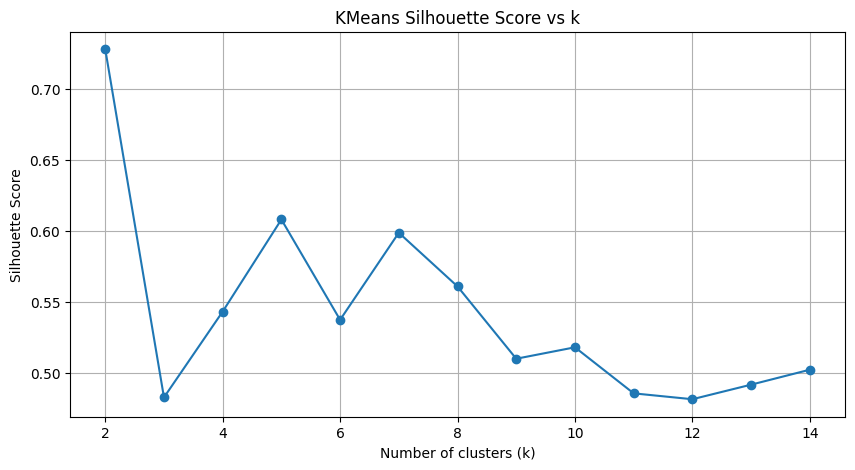

In [72]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

k_values = range(2, 15)  # You can increase upper bound
silhouette_scores = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, n_init=20, random_state=42)
    labels = kmeans.fit_predict(embedding)
    score = silhouette_score(embedding, labels)
    silhouette_scores.append(score)
    print(f"k={k}, silhouette={score:.4f}")


best_k = k_values[np.argmax(silhouette_scores)]
print("\nBest number of clusters:", best_k)


best_kmeans = KMeans(n_clusters=best_k, n_init=20, random_state=42)
final_labels = best_kmeans.fit_predict(embedding)


plt.figure(figsize=(10,5))
plt.plot(k_values, silhouette_scores, marker='o')
plt.xlabel("Number of clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("KMeans Silhouette Score vs k")
plt.grid(True)
plt.show()

In [74]:
kmeans = KMeans(n_clusters=3, n_init=20, random_state=42)
labels = kmeans.fit_predict(embedding)

# Now we will add the cluster labels learned from KMeans to the previous df that contained the 2D UMAP coordinates
plot_df['cluster'] = labels.astype(str)

# Plot the UMAP with the labels
fig = px.scatter(
    plot_df,
    x="x",
    y="y",
    color="cluster",
    hover_name="recipe_name",
    title="UMAP + KMeans Clustering of Recipes",
    opacity=0.8
)

#fig.update_traces(marker=dict(size=7))
fig.show()

In [58]:
np.isnan(embedding).sum()

np.int64(35450)

In [5]:
import itertools

results = []

for n_n, md in itertools.product([5, 10, 15, 30], [0.0, 0.1, 0.3]):
    um = umap.UMAP(
        n_neighbors=n_n,
        min_dist=md,
        metric="jaccard",
        random_state=42
    )
    emb = um.fit_transform(df.values)

    for mcs, ms in itertools.product([10, 20, 30], [1, 5]):
        clusterer = hdbscan.HDBSCAN(
            min_cluster_size=mcs,
            min_samples=ms
        ).fit(emb)

        stability = np.mean(clusterer.cluster_persistence_)
        prob_mean = clusterer.probabilities_.mean()
        n_clusters = len(set(clusterer.labels_)) - (1 if -1 in clusterer.labels_ else 0)
        noise = np.mean(clusterer.labels_ == -1)

        results.append({
            "n_neighbors": n_n,
            "min_dist": md,
            "min_cluster_size": mcs,
            "min_samples": ms,
            "stability": stability,
            "prob_mean": prob_mean,
            "n_clusters": n_clusters,
            "noise": noise
        })

# Sort by the best combinations
df_results = pd.DataFrame(results)
df_results.sort_values(by=["stability", "prob_mean"], ascending=False).head()

/Users/josepomarino/Desktop/Data Projects/ingredients/ingredients/lib/python3.12/site-packages/umap/umap_.py:1887: UserWarning: gradient function is not yet implemented for jaccard distance metric; inverse_transform will be unavailable
  warn(
/Users/josepomarino/Desktop/Data Projects/ingredients/ingredients/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Users/josepomarino/Desktop/Data Projects/ingredients/ingredients/lib/python3.12/site-packages/pynndescent/pynndescent_.py:939: UserWarning: Failed to correctly find n_neighbors for some samples. Results may be less than ideal. Try re-running with different parameters.
  warn(
/Users/josepomarino/Desktop/Data Projects/ingredients/ingredients/lib/python3.12/site-packages/umap/umap_.py:127: UserWarning: A few of your vertices were disconnected from the manifold.  This shouldn't cause problems.
Disconnection_distance = 1 has removed

,n_neighbors,min_dist,min_cluster_size,min_samples,stability,prob_mean,n_clusters,noise
70,30,0.3,30,1,0.303221,0.980879,2,0.015488
71,30,0.3,30,5,0.295073,0.979493,2,0.015488
53,15,0.3,30,5,0.276573,0.970164,3,0.025666
69,30,0.3,20,5,0.273047,0.979288,2,0.015488
65,30,0.1,30,5,0.248888,0.979097,2,0.015351


In [6]:
umap_model = umap.UMAP(
    n_neighbors=30,
    min_dist=0.3,
    metric='jaccard',
    random_state=42
)
embedding = umap_model.fit_transform(df.values)

clusterer = hdbscan.HDBSCAN(
    min_cluster_size=30, 
    min_samples=1,
    cluster_selection_epsilon=0.0
)
labels = clusterer.fit_predict(embedding)

plot_df = pd.DataFrame({
    "UMAP1": embedding[:, 0],
    "UMAP2": embedding[:, 1],
    "cluster": labels.astype(str),
    "recipe": df.index
})

fig = px.scatter(
    plot_df,
    x="UMAP1",
    y="UMAP2",
    color="cluster",
    hover_name="recipe",
    title="UMAP + HDBSCAN Clustering of Recipes",
    opacity=0.8
)

fig.update_traces(marker=dict(size=7))
fig.show()

/Users/josepomarino/Desktop/Data Projects/ingredients/ingredients/lib/python3.12/site-packages/umap/umap_.py:1887: UserWarning: gradient function is not yet implemented for jaccard distance metric; inverse_transform will be unavailable
  warn(
/Users/josepomarino/Desktop/Data Projects/ingredients/ingredients/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Users/josepomarino/Desktop/Data Projects/ingredients/ingredients/lib/python3.12/site-packages/pynndescent/pynndescent_.py:939: UserWarning: Failed to correctly find n_neighbors for some samples. Results may be less than ideal. Try re-running with different parameters.
  warn(
/Users/josepomarino/Desktop/Data Projects/ingredients/ingredients/lib/python3.12/site-packages/umap/umap_.py:127: UserWarning: A few of your vertices were disconnected from the manifold.  This shouldn't cause problems.
Disconnection_distance = 1 has removed

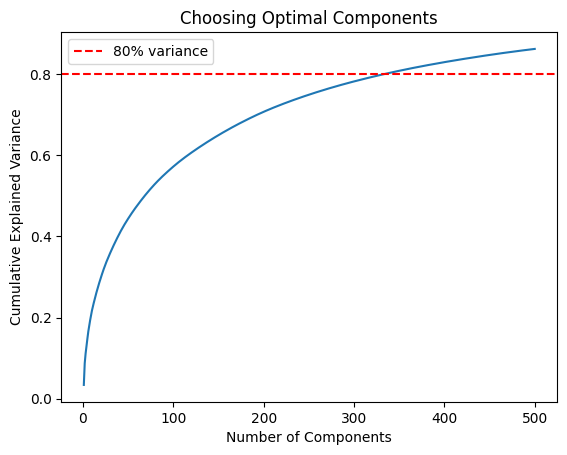

Components needed for 80% variance: 335


In [14]:
# Trying out TruncatedSVD for dimensionality reduction
n_components = 500
svd = TruncatedSVD(n_components=n_components, random_state=42)
X_reduced = svd.fit_transform(df.values)

# Explained variance to choose n_components
explained_var = np.cumsum(svd.explained_variance_ratio_)
plt.plot(range(1, n_components+1), explained_var)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Choosing Optimal Components')
plt.axhline(y=0.80, color='r', linestyle='--', label='80% variance')
plt.legend()
plt.show()

# Usually aim for 80% variance explained
min_components = np.argmax(explained_var >= 0.80) + 1
print(f"Components needed for 80% variance: {min_components}")

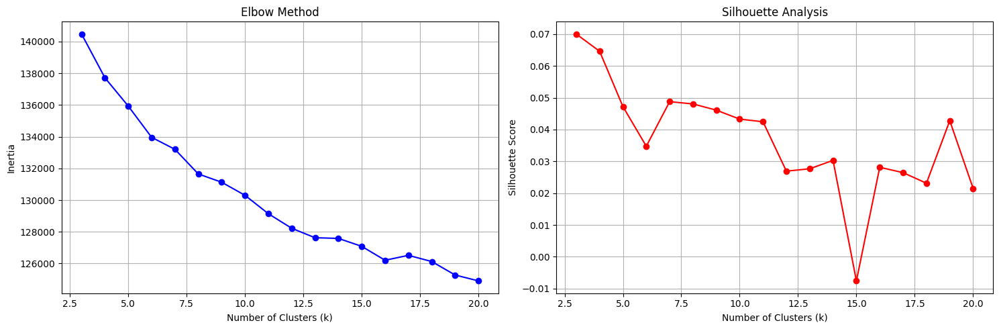

In [ ]:
# Find optimal k using elbow method and silhouette score
inertias = []
silhouette_scores = []
K_range = range(3, 21)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_reduced)
    inertias.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X_reduced, kmeans.labels_))

# Plot both metrics
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

ax1.plot(K_range, inertias, 'bo-')
ax1.set_xlabel('Number of Clusters (k)')
ax1.set_ylabel('Inertia')
ax1.set_title('Elbow Method')
ax1.grid(True)

ax2.plot(K_range, silhouette_scores, 'ro-')
ax2.set_xlabel('Number of Clusters (k)')
ax2.set_ylabel('Silhouette Score')
ax2.set_title('Silhouette Analysis')
ax2.grid(True)

plt.tight_layout()
plt.show()

In [16]:
# Final clustering with optimal k
optimal_k = 7  # Based on your analysis
kmeans_final = KMeans(n_clusters=optimal_k, random_state=42, n_init=20)
clusters = kmeans_final.fit_predict(X_reduced)

In [22]:
# Visualize with UMAP
reducer = umap.UMAP(
    n_components=2,
    metric='jaccard',
    n_neighbors=15,
    min_dist=0.1,
    random_state=42
)
embedding = reducer.fit_transform(df.values)

plot_df = pd.DataFrame({
    "UMAP1": embedding[:, 0],
    "UMAP2": embedding[:, 1],
    "cluster": clusters.astype(str),
    "recipe": df.index
})

# Plot the UMAP with the labels
fig = px.scatter(
    plot_df,
    x="UMAP1",
    y="UMAP2",
    color="cluster",
    hover_name="recipe",
    title="UMAP + TruncSVD + KMeans Clustering of Recipes",
    opacity=0.8
)

#fig.update_traces(marker=dict(size=7))
fig.show()

/Users/josepomarino/Desktop/Data Projects/ingredients/ingredients/lib/python3.12/site-packages/umap/umap_.py:1887: UserWarning:

gradient function is not yet implemented for jaccard distance metric; inverse_transform will be unavailable

/Users/josepomarino/Desktop/Data Projects/ingredients/ingredients/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/Users/josepomarino/Desktop/Data Projects/ingredients/ingredients/lib/python3.12/site-packages/pynndescent/pynndescent_.py:939: UserWarning:

Failed to correctly find n_neighbors for some samples. Results may be less than ideal. Try re-running with different parameters.

/Users/josepomarino/Desktop/Data Projects/ingredients/ingredients/lib/python3.12/site-packages/umap/umap_.py:127: UserWarning:

A few of your vertices were disconnected from the manifold.  This shouldn't cause problems.
Disconnection_distance = 1 has removed 12873 edges.
It 